# `Семинар 05. Segmentation and detection`


### `Материалы составили Федоров Артем, Оганов Александр (@welmud), Солдатов Владислав, Глеб Афанасьев, Максим Находнов, Варламова Арина`

#### `Москва, Осенний семестр 2025`

Ноутбук опирается на материалы курса [Введение в глубокое обучение](https://github.com/mmp-practicum-team/mmp_dl_spring_2025/tree/main) кафедры ММП ВМК МГУ. Основной материал взят с [ноутбука](https://github.com/mmp-practicum-team/mmp_dl_spring_2025/blob/main/Seminars/09-segmentation/09-segmentation.ipynb).

- Все логи wandb доступны по [ссылке](https://wandb.ai/3145tttt/ImageSegmentationPrac/workspace). 
- Чекпоинт модели сегментации находится по [ссылке](https://disk.yandex.ru/d/S0XRNZPd8uohJw).

In [1]:
import os
import random
import skimage
import numpy as np
from PIL import Image
import tqdm

import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader


from torchvision import transforms
from torchvision.datasets import VisionDataset

import albumentations as A
from albumentations.pytorch import ToTensorV2

import wandb

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')

import warnings
warnings.filterwarnings('ignore')

torch.backends.cudnn.benchmark = True
torch.use_deterministic_algorithms(False)

torch.backends.cudnn.allow_tf32 = True
torch.backends.cuda.matmul.allow_tf32 = True

torch.autograd.profiler.profile(False)
torch.autograd.profiler.emit_nvtx(False)
torch.autograd.set_detect_anomaly(False)

/home/alexandr/miniconda3/envs/ml/lib/python3.9/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
def set_global_seed(seed: int) -> None:
    """Set global seed for reproducibility.
    :param int seed: Seed to be set
    """
    random.seed(seed)
    np.random.seed(seed)
    
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_global_seed(42)

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

### `Задача сегментации изображений`

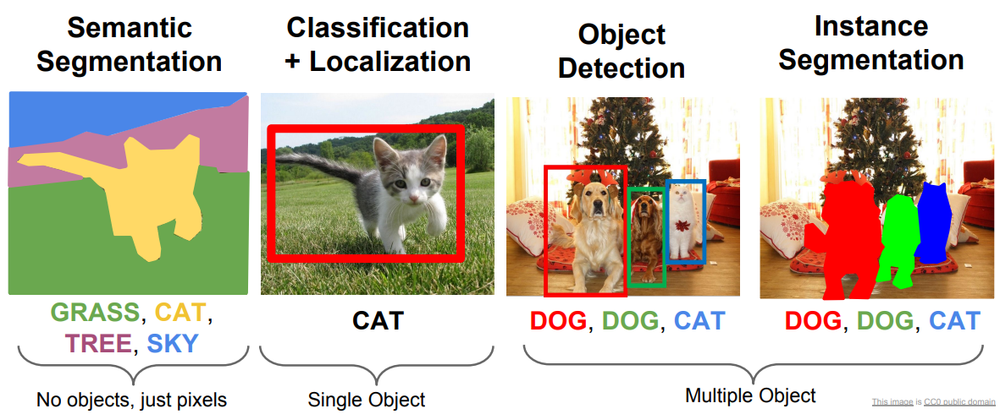

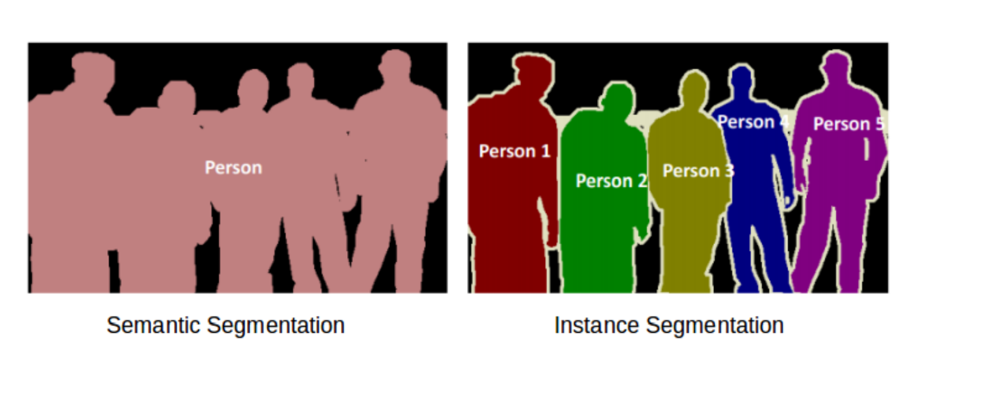

#### `Классическая схема сегментационных нейронных сетей — сверточный кодировщик-декодировщик`

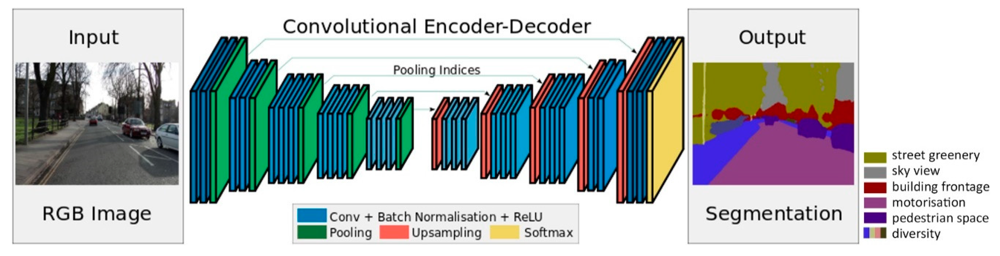

В данном подходе можно выделить следующие проблемы:

- Ответ должен быть близок по размеру ко входу

- Чем глубже тем лучше понимания того, что изображено, но забыватся контекст

- Receptive field на последних слоях должен быть достаточно большим

#### `В качестве метрик: DiceLoss и Intersection over Union (мера Жаккарда)`

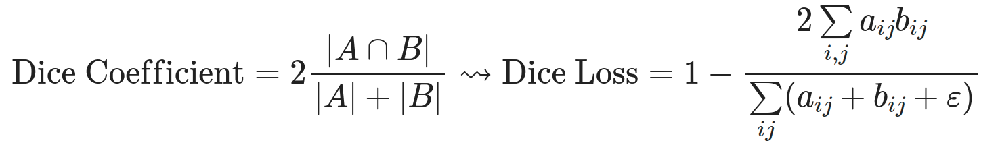

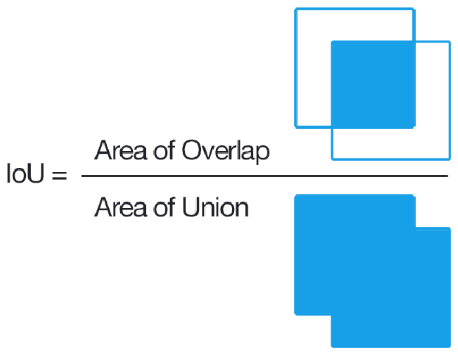

### `Операции увеличения размерности:`

#### `Upsampling`

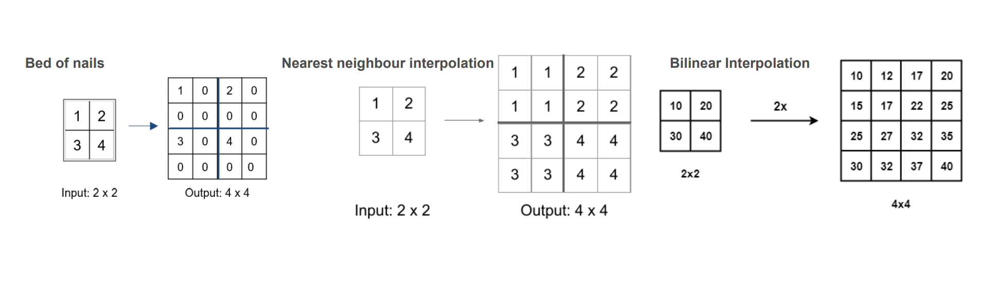

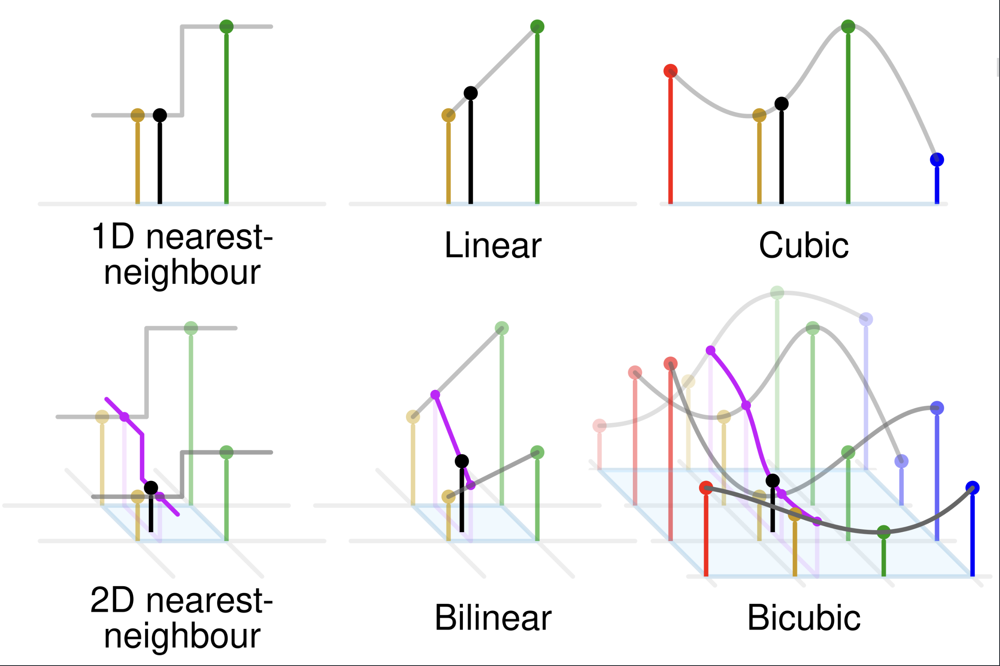

In [4]:
?torch.nn.Upsample


---

Провизуализируем работу популярных интерполяторов: `nearest`, `bilinear` и `bicubic`. Для этого возьмем тензор малой размерности 2x2 и экстраполируем его на большую размерность 4x6. Визуализация работы методов представлена ниже при помощи метода matshow, одинаковые цвета говорят об одинаковом значении после, близкие цвета – соответсвенно о близости чисел но модулю.

In [5]:
def show_tensor(tensor, text, axis=None):
    if axis is None:
        axis = plt.gca()
    sns.heatmap(tensor.squeeze().detach().cpu().numpy(), cbar=False, annot=True, ax=axis)
    axis.set(xticklabels=[], yticklabels=[])
    axis.set_title(text)

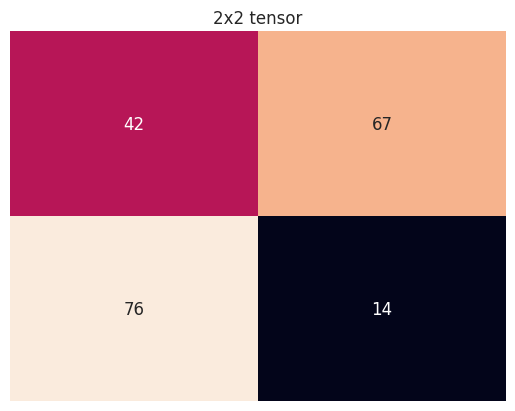

In [6]:
ex = torch.randint(0, 100, (2,2)).view(1, 1, 2, 2).float()
show_tensor(ex, '2x2 tensor')

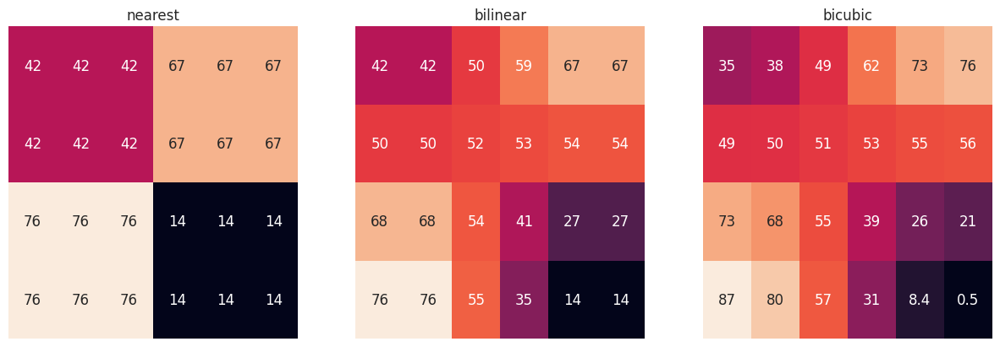

In [7]:
fig, axis = plt.subplot_mosaic([['nearest', 'bilinear', 'bicubic']])
fig.set_figwidth(15)

# raw test of nearest interpolation
show_tensor(torch.nn.Upsample(scale_factor=(2,3), mode='nearest')(ex), 'nearest', axis['nearest'])

# raw test of bilinear interpolation
show_tensor(torch.nn.Upsample(scale_factor=(2,3), mode='bilinear')(ex), 'bilinear', axis['bilinear'])

# raw test of bicubic interpolation
show_tensor(torch.nn.Upsample(scale_factor=(2,3), mode='bicubic')(ex), 'bicubic', axis['bicubic'])

Видно, что `nearest` метод в проинтерполированном тензоре оставляет сегменты одинаковых чисел, что следует из принципа его работы и вполне ожидаемо. Работы `bilinear` и `bicubic` уже более схожи между собой, к тому же появляется полезное свойство – плавный переход значений в тензоре. Однако использование `bicubic` сопровождается особенностью, которую стоит учитывать

> В отличии от `bilinear`, `bicubic` не обязуется содержать все интерполируемые пиксели в сегменте минимального и максимального значений, по которым производится интерполяция. 

Поэтому абсолютно всегда стоит отдавать предпочтение более очевидному и предсказуемому `bilinear` или `nearest`.

#### `Транспонированная свертка`

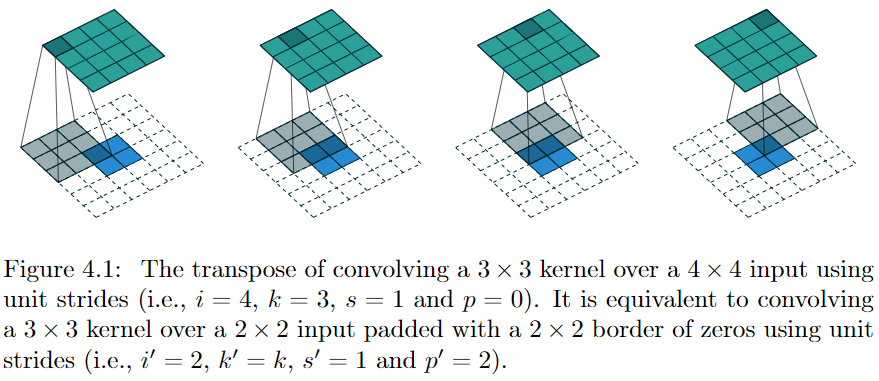

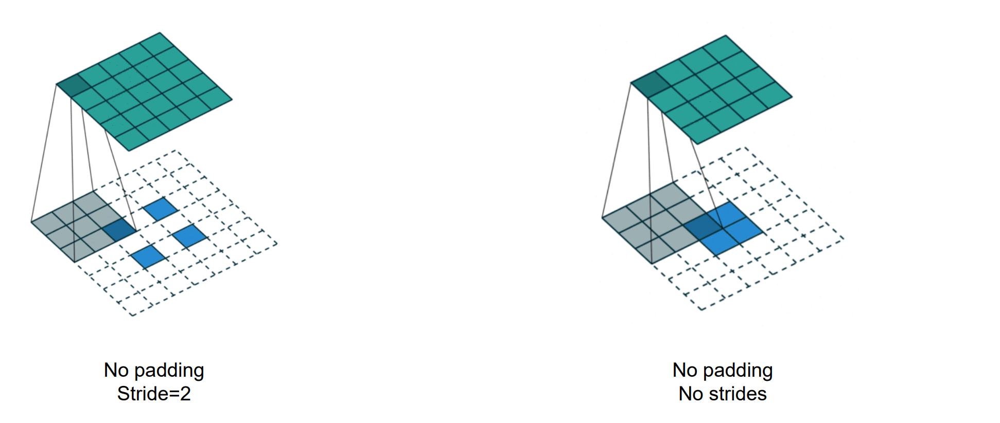

In [8]:
?torch.nn.ConvTranspose2d

```python
torch.nn.ConvTranspose2d(
    in_channels, out_channels, kernel_size, stride=1,
    padding=0, output_padding=0, groups=1, bias=True,
    dilation=1, padding_mode='zeros', device=None,
    dtype=None
)
```

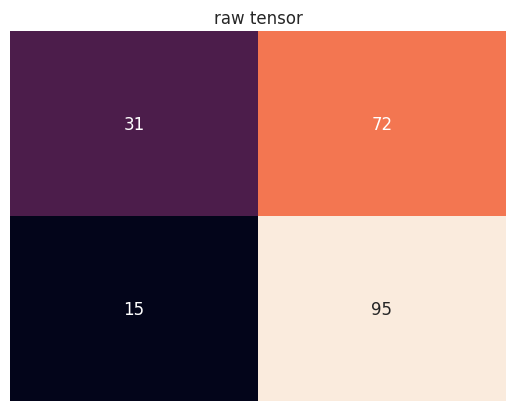

In [9]:
upconv = torch.nn.ConvTranspose2d(1, 1, 3)
ex = torch.randint(0, 100, (2,2)).view(1, 1, 2, 2).float()
show_tensor(ex, text='raw tensor')

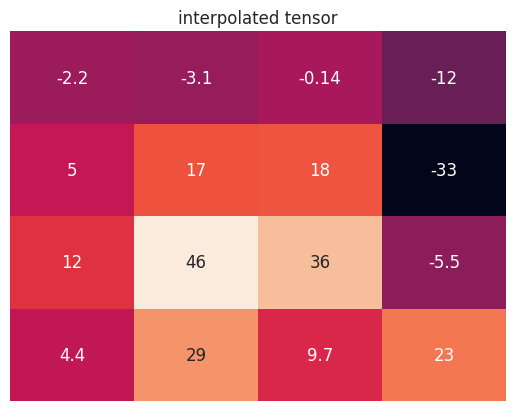

In [10]:
show_tensor(upconv(ex), text='interpolated tensor')

### `U-Net`

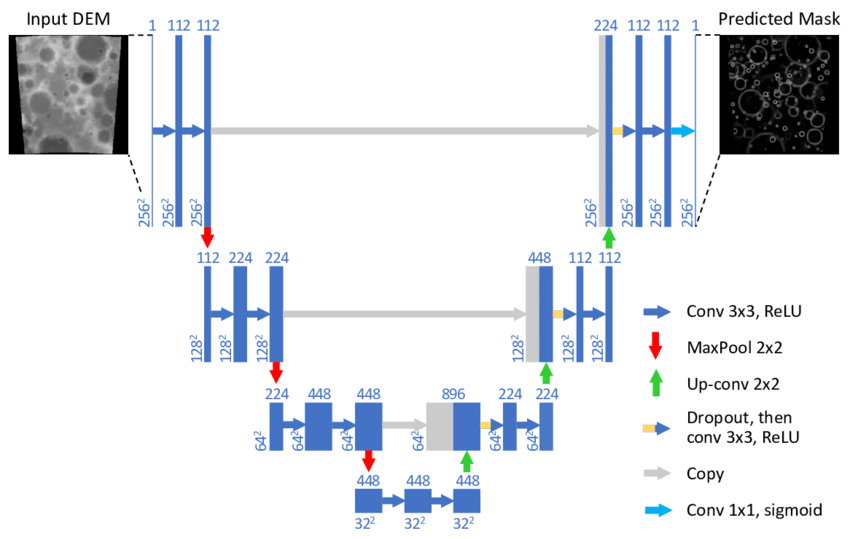

### `LinkNet`

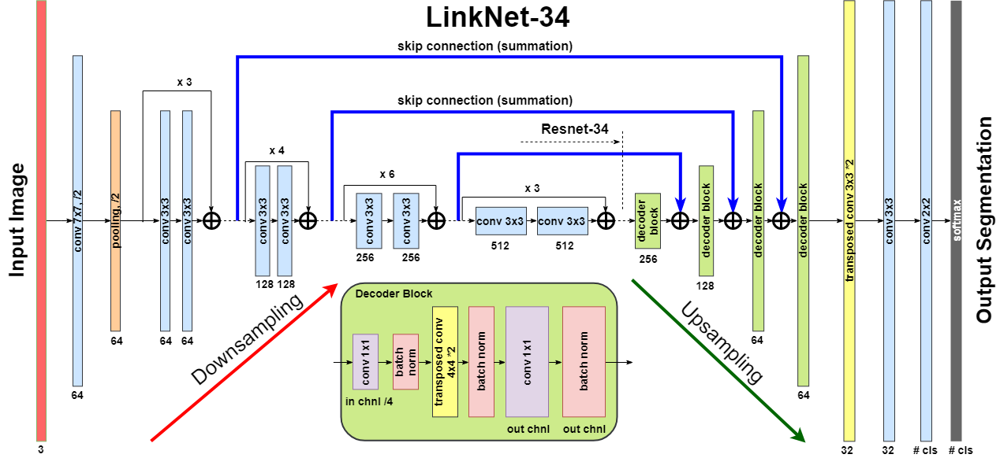

### `Датасет`

Мы будем решать задачу семантической сегментации для датасета [AlbPets](https://www.robots.ox.ac.uk/~vgg/data/pets/). Датасет содержит размеченную выборку с изображениями домашних животных.

In [11]:
from torchvision.datasets.utils import download_and_extract_archive

class AlbPets(VisionDataset):
    _RESOURCES = (
        ("https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz", "5c4f3ee8e5d25df40f4fd59a7f44e54c"),
        ("https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz", "95a8c909bbe2e81eed6a22bccdf3f68f"),
    )

    def _download(self) -> None:
        for url, md5 in self._RESOURCES:
            download_and_extract_archive(url, download_root=self._base_folder, md5=md5)

    def __init__(self, root: str, split='train', transforms=None, download=False, erosion=0):
        """Dataset with masked pets
        """
        super().__init__(root)

        self._base_folder   = os.path.join(root, "oxford-iiit-pet")
        self._images_folder = os.path.join(self._base_folder, "images")
        self._anns_folder   = os.path.join(self._base_folder, "annotations")
        self._segs_folder   = os.path.join(self._anns_folder, "trimaps")

        self._split = split

        if download:
            self._download()

        image_ids = []
        with open(os.path.join(self._anns_folder, f"{self._split}.txt")) as file:
            for line in file:
                image_id, label, *_ = line.strip().split()
                image_ids.append(image_id)

        self._images = [os.path.join(self._images_folder, f"{image_id}.jpg") for image_id in image_ids]
        self._segs   = [os.path.join(self._segs_folder,   f"{image_id}.png") for image_id in image_ids]

        self.transforms = transforms

        self.erosion = erosion

    def __len__(self):
        return len(self._images)

    def __getitem__(self, idx):
        
        # get image
        image = Image.open(self._images[idx]).convert('RGB')
        mask  = Image.open(self._segs[idx])

        image = np.array(image)
        mask  = np.array(mask) != 2
        # if defined erose gap between object and mask boundaries
        
        mask = skimage.morphology.binary_erosion(
            mask,
            footprint=skimage.morphology.disk(self.erosion)
        ).astype(np.float32)

        if self.transforms:
            transformed  = self.transforms(image=image, mask=mask)
            image = transformed['image']
            mask  = transformed['mask']
        return image, mask

Каждый объект датасета представляет собой кортеж из изначального изображения с питомцем на фоне и маски, выделяющей это животное. 

**Вопрос:** Каковы особенности данных?

1. Все границы выделялись разметчиками, а значит могут быть допущены ошибки (в выделенную зону животного попал фон, неточные границы в зоне хвоста, усов, ушей и так далее).
2. Так как решаемая задача сводится к задаче попиксельной классификации (об этом далее), в большей степени опасны ошибки попадания фона в выделенную зону. Такая интуиция следует из того, что одно и то же животное может находиться на разном бэкграунде и тем самым сверточные фичи в теории могут себя плохо чувствовать, когда различный фон будет смешиваться с животным. 

Таким образом проведем первичную предобработку – удалим потенциально лишние границы выделенных областей, попадающие на фон, при помощи **операции Эрозии**. 

In [12]:
# AlbPets('.', split='trainval', download=True, transforms=ToTensorV2(), erosion=eros_par)

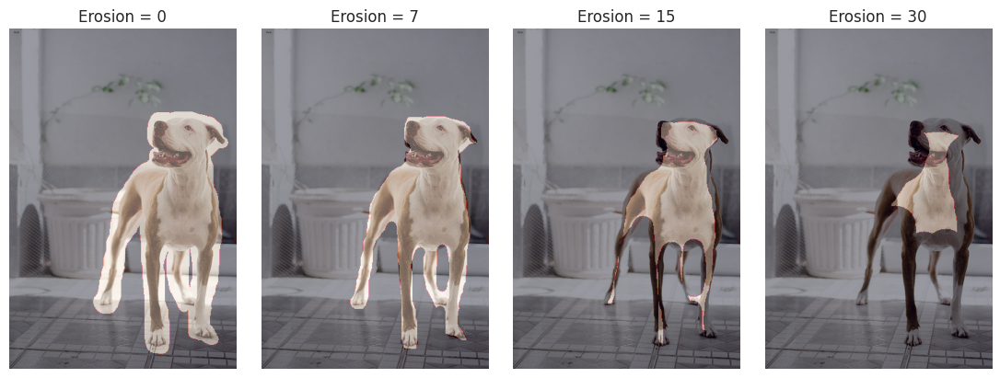

In [13]:
erosion_parameter = [0, 7, 15, 30]
fig, axis = plt.subplots(1, len(erosion_parameter))
fig.set_figwidth(15)

for iteration, eros_par in enumerate(erosion_parameter):
    temp_dataset = AlbPets('.', split='trainval', download=False, transforms=ToTensorV2(), erosion=eros_par)
    img, mask = temp_dataset[100]
    axis[iteration].imshow(img.permute(1, 2, 0))
    axis[iteration].imshow(mask, alpha=.4)
    axis[iteration].grid('off')
    axis[iteration].axis('off')
    axis[iteration].set_title(f'Erosion = {eros_par}')

fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=-0.2, hspace=None)

### `Аугментации`

Для более сложных аугментаций можно использовать специализированную [библиотеку Albumentations](https://albumentations.ai/docs/) либо [transforms v2](https://pytorch.org/vision/main/auto_examples/transforms/plot_transforms_getting_started.html) из `torchvision`.

Подготовим пайплайн аугментации данных, в которую добавим:

1. Зеркальное отображение изображения
2. Параллельный сдвиг, поворот, масштабирование
3. Изменение гаммы цветов
4. Контраст и светлость
5. Сеточная деформация
6. Тиснение

Подробнее про самое интересное:

* `RGBShift` – аугментация случайным образом сдвигает значения каждого из цветовых каналов (R, G, B) на заданное число. Это создает эффект хроматических аберраций или других артефактов камер.

* `GridDistortion` – метод делит изображение на сетку (grid) и применяет нелинейные искажения к каждой ячейке этой сетки. Самый простой пример из жизни, где вы могли встречаться с такой процедурой – PhotoShop с mesh-transformation

* `Emboss` – создает эффект "тиснения" или "рельефа", что достигается путем применения специального фильтра свертки, подчеркивающего различия в интенсивности соседних пикселей, создавая эффект освещения и тени.


In [14]:
CHANNEL_MEAN = (0.485, 0.456, 0.406)
CHANNEL_STD  = (0.229, 0.224, 0.225)

train_dataset = AlbPets(
    root       = '.', 
    split      = 'trainval',
    transforms = A.Compose([
        A.Resize(224, 224),
        A.HorizontalFlip(p=.5),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=10, p=.4),
        A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=.4),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.3, p=.4),
        A.GridDistortion(),
        A.Emboss(strength=(.1, .3), p=.4),
        A.Normalize(mean=CHANNEL_MEAN, std=CHANNEL_STD),
        ToTensorV2()
    ]), 
    erosion    = 7
)

test_dataset = AlbPets(
    root       = '.', 
    split      = 'test',
    transforms = A.Compose([
        A.Resize(224, 224),
        A.Normalize(mean=CHANNEL_MEAN, std=CHANNEL_STD),
        ToTensorV2()
    ]), 
    erosion    = 7
)

In [15]:
train_dataloader = DataLoader(
    train_dataset, 
    batch_size        = 64, 
    shuffle           = True,
    num_workers       = 0, 
    pin_memory        = True, 
    pin_memory_device = device, 
    drop_last         = True
)
test_dataloader = DataLoader(
    test_dataset, 
    batch_size        = 64, 
    shuffle           = False,
    num_workers       = 0, 
    pin_memory        = True, 
    pin_memory_device = device
)

Посмотрим на примеры получаемых изображений и их масок. Для этого зафиксируем какое-то множество изначальных изображений и сравним разные запуски (так как мы используем случайные аугментации).

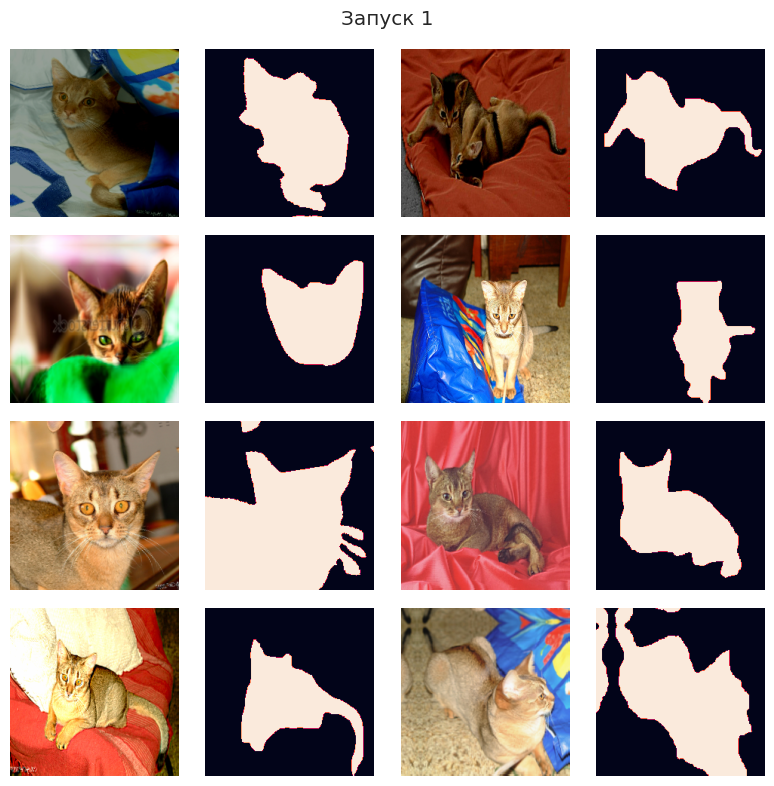

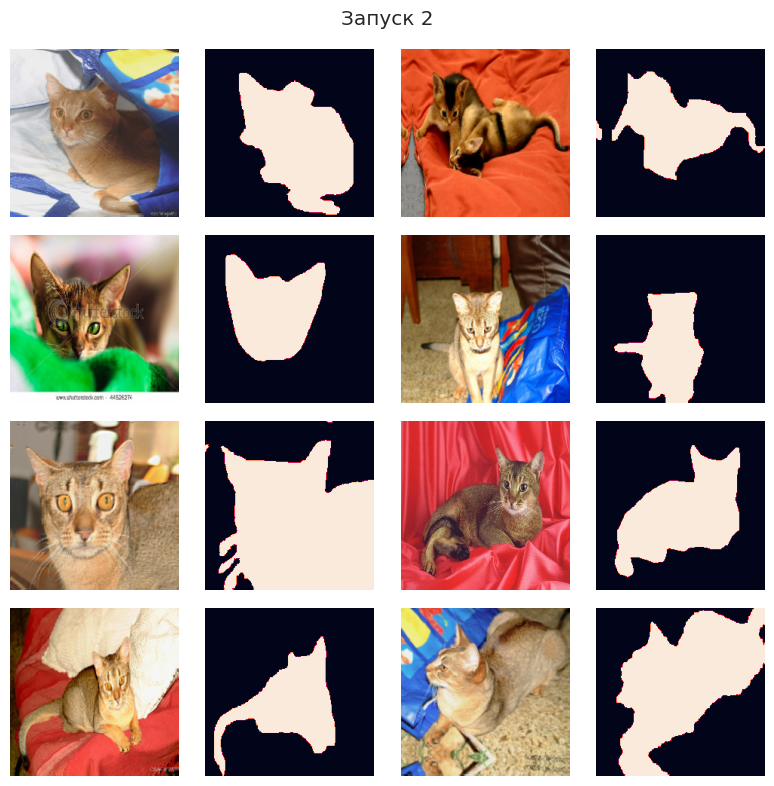

In [16]:
def denormalize(image):
    image = image.permute(1, 2, 0).numpy()
    image = image * np.array(CHANNEL_STD) + np.array(CHANNEL_MEAN)
    image = np.clip(image, 0, 1)
    return image

def vis_seg_img(imgs, masks, title=""):

    fig, axs = plt.subplots(4, 4, figsize=(8, 8))
    fig.suptitle(title)
    for idx in range(4):
        axs[idx, 0].imshow(denormalize(imgs[idx]))
        axs[idx, 1].imshow(masks[idx])

        axs[idx, 2].imshow(denormalize(imgs[idx + 4]))
        axs[idx, 3].imshow(masks[idx + 4])

    for ax in axs.ravel():
        ax.axis('off')

    fig.tight_layout()
    plt.show()

vis_dataloader = DataLoader(
    train_dataset, 
    batch_size        = 8, 
    shuffle           = False,
    num_workers       = 0
)
imgs, masks = next(iter(vis_dataloader))
vis_seg_img(imgs=imgs, masks=masks, title="Запуск 1")

imgs, masks = next(iter(vis_dataloader))
vis_seg_img(imgs=imgs, masks=masks,  title="Запуск 2")

### `Нейронная сеть`

В качестве примера архитектуры возьмем `encoder-decoder`, получающий высоко-организованные фичи из подаваемых изображений при помощи предобученной сети `encoder` и `decoder`, генерирующей по ним маски объектов.

#### `Encoder`

В качестве `encoder` (backbone) будет браться `VGG11_bn`, с уже обученными весами. Именно поэтому выше мы изменяли размер изображения до 224 пикселей.

*Замечание:* суффикс `_bn` означает, что в модели есть слои батч нормализации, которые позволяют модели обучаться end-to-end.

![vggarc.png](https://raw.githubusercontent.com/mmp-practicum-team/mmp_practicum_spring_2022/main/Seminars/Seminar%2005/images/vggarc.png)

**Conv2d:**

![conv2d.png](https://raw.githubusercontent.com/mmp-practicum-team/mmp_practicum_spring_2022/main/Seminars/Seminar%2005/images/conv2d.png)

In [17]:
from torchvision.models import vgg11_bn, VGG11_BN_Weights

Посмотрим на часть сети, которая отвечает за получение фичей.

In [18]:
encoder = vgg11_bn(weights=VGG11_BN_Weights).features
encoder

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): ReLU(inplace=True)
  (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): ReLU(inplace=True)
  (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (13): ReLU(inplace=True)
  (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, cei

#### `Заморозка VGG11`

В качестве энкодера мы выбрали предобученную нейросеть на датасете `ImageNET`, следовательно данная модель уже способна доставать "хорошие" фичи из изображений. Обучение следующей части нашей архитектуры может сломать работу `VGG11`, подстроив ее выходы под работу недообученой сети, что выиграет в краткосрочной перспективе, но ухудшит качество в долгосрочной. 

Такая ситуация распространена в трансфер-лернинге, одним из простейших способов борьбы с возможными проблемами – упредить изменение весов VGG11 в принципе, запретив им использовать градиенты (то есть они не будут учавствовать в оптимизации). 

In [19]:
for p in encoder.parameters():
    p.requires_grad = False
    
# encoder.requires_grad = False

### `Decoder`

`Decoder` построим из последовательной интерполяции изображений с `mixin`-слоев при помощи сверток. Последним слоем сети будет слой `classifier`, принимающий фичи для каждого пикселя и решающий задачу бинарной логистической регрессии – пиксель принадлежит фону или животному.

Для простоты примера специально выбрана архитектура без `residual-connection`, не использующая транспозиционных сверток, вместо которых использует `interpolation` c `nearest` методом..

![encdec1.png](https://raw.githubusercontent.com/mmp-practicum-team/mmp_practicum_spring_2022/main/Seminars/Seminar%2005/images/encdec1.png)

**ConvTransposed2d:**
![transposed.png](https://raw.githubusercontent.com/mmp-practicum-team/mmp_practicum_spring_2022/main/Seminars/Seminar%2005/images/transposed.png)

Определим декодер как последовательное применение самостоятельных операторов `Upsampling`, каждый увеличивающий разрешение изображения в два раза. Для этого определим такой оператор как последовательное выполенение операций:

1. Интерполяции 
2. Локального смешения получаемой карты активаций при помощи свертки
3. Применение `DropOut` в качестве регуляризации для свертки
4. Активации `ReLU` и регуляризации `BatchNorm`. 

In [20]:
class UpsamplingBlock(nn.Module):
    def __init__(self, channel_in, channel_out, dropout_rate=0.3):
        super().__init__()
        
        self.conv = nn.Conv2d(channel_in, channel_out, kernel_size=3, padding=1)
        self.dropout = nn.Dropout(dropout_rate)
        self.activation = nn.ReLU()
        self.batch_norm = nn.BatchNorm2d(channel_out)
        
    def forward(self, x):
        x = F.interpolate(x, scale_factor=2)
        x = self.conv(x)
        x = self.dropout(x)
        x = self.activation(x)
        return self.batch_norm(x)
    
class FCNDecoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self._channel_map = [512, 512, 256, 128, 64, 32]

        upsampling_blocks = []
        for channel_in, channel_out in zip(self._channel_map[:-1], self._channel_map[1:]):
            upsampling_blocks.append(
                UpsamplingBlock(channel_in, channel_out)
            )
        self.blocks = nn.ModuleList(upsampling_blocks)
        
    def forward(self, x):
        for block in self.blocks:
            x = block(x)
        return x

### `Full Model`

Итоговая сеть состоит из трех модулей: 

1. `encoder`
2. `decoder`
3. `clasifier`

In [21]:
class FCN32(nn.Module):
    def __init__(self, encoder, decoder, classifier):
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        self.classifier = classifier
        
    def forward(self, x):
        # get features
        x = self.encoder(x)
        
        # create feature map for each pixel
        x = self.decoder(x)
        
        # solve linear LogRegression for each pixel
        x = self.classifier(x)
        
        return x

In [22]:
set_global_seed(42)

# get vgg as encoder and freeze weights
encoder = vgg11_bn(weights=VGG11_BN_Weights).features
for p in encoder.parameters():
    p.requires_grad = False

# define decoder and classifier
decoder = FCNDecoder()
classifier = nn.Conv2d(32, 1, kernel_size=1)

# encoder (vgg)       : [Batch x 3 x 256 x 256]  -> [Batch x 512 x 8 x 8]
# decoder (FCNDecoder): [Batch x 512 x 8 x 8]    -> [Batch x 64 x 256 x 256]
# classifier          : [Batch x 64 x 256 x 256] -> [Batch x 1 x 256 x 256]
model = FCN32(encoder, decoder, classifier)
model.to(device)

FCN32(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): MaxPool2d(k

Проверим, что модель способна сделать forward pass так, как мы того ожидаем. Мы ожидаем на выходе получить маску, размер которой совпдает с размерами исходного изображения и имеет 1 канал.

In [23]:
dummy_input = torch.ones((1, 3, 224, 224)).to(device)
out = model(dummy_input)

out.shape

torch.Size([1, 1, 224, 224])

Проанализируем количество параметров сети и какая часть итоговой сети будет обучаемой. 

In [24]:
def print_params_count(model):

    total_params = sum(p.numel() for p in model.parameters())
    total_params_grad = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    model_name = model.__class__.__name__
    print(f"Информация о числе параметров модели: {model_name}")
    print(f"Всего параметров: \t\t {total_params}")
    print(f"Всего обучаемых параметров: \t {total_params_grad}")
    print(f"Доля обучаемых параметров: \t {total_params_grad / total_params:0.3f}")
    print()

In [26]:
print_params_count(model)

Информация о числе параметров модели: FCN32
Всего параметров: 		 13155009
Всего обучаемых параметров: 	 3929025
Доля обучаемых параметров: 	 0.299



### `Функция потерь, оптимизатор, ...`

Будем использовать `AdamW` оптимизатор. Необходимость в его использовании заключается в использовании `weight_decay`, операции, с которой классический `Adam` работает некорректно.

**Обратите внимание**, что мы решаем задачу **бинарной** классификации, то есть модель выдает логит того, что пиксель относится к животному. Именно поэтому мы будем использовать `torch.nn.BCEWithLogitsLoss`

In [27]:
lr           = 1e-3
weight_decay = 1e-4

criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=.90) 

### `Метрики`

Одним из важнейших аспектов любого исследования и работы является возможность сравнения ваших результатов с бейзлайнами или прочими решениями. Для этого требуется, чтобы используемые оценочные метрики были валидны - помимо вопроса адекватности их аналитической записи, немалую роль играет и реализация. Для экосистемы `torch` существует свой аналог стандарта (как раньше для вас таким стандартом выступал `sklearn.metrics`) - `torchmetrics`

[TorchMetrics](https://lightning.ai/docs/torchmetrics/stable/) - это библиотека, предназначенная для упрощения и стандартизации расчета метрик качества моделей машинного обучения. Она предоставляет набор готовых реализаций популярных метрик (например, accuracy, F1-score, AUC, MSE, perplexity, FID, MS-SSIM, IoU) совместимых с экосистемой. От самой библиотеки возьмем только `IoU`, как самую подходящую для решаемой задачи метрику.

In [28]:
# !pip install torchmetrics -q

In [29]:
from torchmetrics import JaccardIndex

2025-10-06 16:51:02.562690: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759758662.643048    3954 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759758662.664277    3954 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1759758662.827770    3954 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1759758662.827803    3954 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1759758662.827804    3954 computation_placer.cc:177] computation placer alr

In [40]:
?JaccardIndex

### `Логирование`

Как понять, как обучается модель? Конечно же следить за динамикой метрик обучения и прочих свойств модели во время обучения! Зададимся вопросом, что мы хотим видеть при обучении сверточных моделей для работы с картинками:

1. Очевидным является логгирование метрик на обучении и валидации. Это требуется, чтобы быстрее обнаружить переобучение модели (при возрастании лосса на валидации и падении на трейне) или её сходимости (чтобы быстрее перейти к новой гипотезе, обрубая обучение не дожидаясь конца), сравнить поведение моделей при обучении. 
2. Следует логировать состояние оптимизационной задачи: шаг `scheduler`'а, если вы его используете
3. Логирование распределения весов на слоях, чтобы быстрее выявлять ситуацию неустойчивости обучения и возможно добавить регуляризацию. 
3. Логирование градиента помогает заметить взрывы и затухания градиентов. Если градиенты слишком шумные (норма градиентов имеет высокую дисперсию), то метод может не сойтись или при решении оптимизационной задачи вы будете долго блуждать.
4. Логирование промежуточных результатов модели: для LLM это может быть результаты генерации по промпту, для нашей же задачи результаты генерации маски

#### `Как логировать?`

На прошлом семинаре вы уже познакомились с `wandb`, сегодня мы попробуем новый функционал, который будет нам полезен при решении задачи сегментации. Кроме того, вы заметите, что многие вещи нельзя было бы отследить выводом или формированием json/csv логеров руками (можно, но слишком сложно и долго).

In [41]:
def log_images(img, ground_truth, pred_mask, img_name, step, threshold=0.5):
    """Log image to wandb with target and predicted masks
    
    Args: 
        img (torch.tensor): tensor of size [3 x 256 x 256]
        ground_truth (torch.tensor): ground truth mask given in dataset of size [256 x 256]
        pred_mask (torch.tensor): predicted by model mask of size [256 x 256]
    """
    # prepare image and masks to log
    img = denormalize(img.detach().cpu())
    ground_truth = ground_truth.detach().cpu().numpy()
    pred_mask = pred_mask.detach().cpu().numpy()
    
    # define textual description of labels in masks
    class_labels = {-1: 'background', 1: 'pet'}
    
    # creation appropriate condition of masks to be logged
    pred_mask[pred_mask < 0]  = -1
    pred_mask[pred_mask >= 0] = 1
    ground_truth[ground_truth < threshold]  = -1
    ground_truth[ground_truth >= threshold] = 1
    
    # create wandb.Image object with masks and log it
    image = wandb.Image(
        img, 
        masks={
            'predictions': {
                'mask_data': pred_mask,
                'class_labels': class_labels
            },
            'ground_truth': {
                'mask_data': ground_truth,
                'class_labels': class_labels
            }
        }
    )
    wandb.log({img_name: image}, step=step)

### `Train loop`

Ниже написан стандартный цикл обучения с логами, которые будут достаточны в учебных целях. **Обратите внимание**, что мы делаем валидацию до обучения, так мы сможем понять, какое качество показывает модель при иницилизации (с чего мы начинаем). Это лишние накладные расходы, но в учебных и исследовательских целях бывает полезно.

In [42]:
@torch.no_grad()
def eval_model(model, loss_fn, metric_fn, test_loader, images_to_log, masks_to_log, batch_num):
    model.eval()
    if test_dataloader is None:
        return 0., 0.

    test_loss = 0.
    test_ious = 0.
    count_img = 0
            
    # iterate over each batch and compute metrics
    for x, y in test_loader:
        x, y = x.to(device), y.to(device)
        out = model(x).squeeze()

        loss = loss_fn(out, y)
        bs = x.shape[0]
        test_loss += loss.item() * bs
        test_ious += metric_fn(out.sigmoid(), y).item() * bs
        count_img += bs

    test_loss = test_loss / count_img
    test_ious = test_ious / count_img
    # log metrics
    wandb.log({
        'test/loss' : test_loss,
        'test/IoU': test_ious,
    }, step=batch_num)

    # log weight distribution in convolution layers
    wandb.log({
        f"weight_hystogram/upsampling_block_{block_num}": 
            wandb.Histogram(block.conv.weight.data.cpu().numpy())
        for block_num, block in enumerate(model.decoder.blocks)
    }, step=batch_num)
            
    # log defined images
    for i, (img, mask, pred_mask) in enumerate(
        zip(images_to_log, 
            masks_to_log, 
            model(images_to_log.to('cuda')).squeeze()
        )
    ):
        log_images(img, mask, pred_mask, f'image_{i}', batch_num)

    return test_loss, test_ious



def train_model(model, num_epochs, optimizer, loss_fn, scheduler,
                train_loader, test_loader=None, log_dir='./dump', verbose=False):
    """Training loop
    
    Args:
        model (torch.nn.Module): training segmentation model
        num_epochs (int): amount of epochs
        optimizer (torch.optim.Optimizer): defined optimizer
        loss_fn (torch.nn.Module): loss cryterion
        scheduler (torch.optim.lr_scheduler): scheduler
        train_loader (torch.utils.data.dataloader.DataLoader): train dataloader
        test_loader (torch.utils.data.dataloader.DataLoader): test dataloader
    """    
    try:
        # get images for logging through the each validation
        if test_loader is not None:
            indexes = torch.as_tensor(np.random.choice(len(test_dataset), 32))
            images_to_log = torch.stack([test_dataset[i][0] for i in indexes], dim=0).cpu()
            masks_to_log  = torch.stack([test_dataset[i][1] for i in indexes], dim=0).cpu()
        
        # get IoU metric, 
        metric_fn = JaccardIndex(task='binary').to(device)

        batch_num = 0    
        pbar = tqdm.tqdm(range(num_epochs), disable=not verbose)
        
        # for study task
        test_loss, test_ious = eval_model(
            model         = model, 
            loss_fn       = loss_fn, 
            metric_fn     = metric_fn, 
            test_loader   = test_dataloader, 
            images_to_log = images_to_log, 
            masks_to_log  = masks_to_log, 
            batch_num     = batch_num
        )
        # main loop over epochs
        for _ in pbar:            
            model.train()

            # enter epoch train
            for x, y in train_loader:
                optimizer.zero_grad()

                x, y = x.to(device), y.to(device)

                out = model(x).squeeze()
                loss = loss_fn(out, y)

                # make optimization step
                loss.backward()
                optimizer.step()
                
                # calc grad norm
                grad_norm = np.sqrt(sum([torch.norm(p.grad).item() ** 2 for p in model.parameters() if p.grad is not None]))
                
                metric = metric_fn(out.sigmoid(), y)
                # log metrics from batch (step)
                wandb.log({
                    'train/IoU'      : metric.item(),
                    'train/loss'     : loss.item(),
                    'optim/grad_norm': grad_norm
                }, step=batch_num)
                
                batch_num += 1
            
            scheduler.step(loss)

            test_loss, test_ious = eval_model(
                model         = model, 
                loss_fn       = loss_fn, 
                metric_fn     = metric_fn, 
                test_loader   = test_dataloader, 
                images_to_log = images_to_log, 
                masks_to_log  = masks_to_log, 
                batch_num     = batch_num
            )

            # save model from current epoch
            torch.save({'model': model.state_dict()}, f'{log_dir}/model.pth')

            # log current learning rate
            wandb.log({'optim/lr': scheduler.get_last_lr()[0]}, batch_num)

            # change small description in progressbar if verbose is True
            if verbose:
                pbar.set_description(
                    "lr: {:.2f}, Train Loss: {:.2f}, Train IoU: {:.2f}; Test Loss: {:.2f}, Test IoU: {:.2f}".format(
                        scheduler.get_last_lr()[0], 
                        loss.item(), 
                        metric.item(), 
                        test_loss, 
                        test_ious
                    )
                )
    finally:
        wandb.finish()

In [31]:
# fix train seed for reproducibility
set_global_seed(42)

# init new experiment in wandb
wandb.init(
    project = 'ImageSegmentationPrac',
    name    = 'SimpleSolution',
    mode    = 'online'
)

# start train
train_model(
    model        = model, 
    num_epochs   = 3, 
    optimizer    = optimizer, 
    loss_fn      = criterion, 
    scheduler    = scheduler,
    train_loader = train_dataloader, 
    test_loader  = test_dataloader, 
    verbose      = True
)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: 3145tttt. Use `wandb login --relogin` to force relogin


lr: 0.00, Train Loss: 0.17, Train IoU: 0.82; Test Loss: 0.17, Test IoU: 0.81: 100%|██████████| 5/5 [15:28<00:00, 185.71s/it]


optim/grad_norm,█▅▅▄▄▄▂▃▂▂▂▂▂▂▂▂▂▂▄▂▂▂▂▁▁▂▁▁▂▁▁▃▂▂▂▂▁▁▁▁
optim/lr,▁▄▆▇█
test/IoU,▁█████
test/loss,█▂▁▁▁▁
train/IoU,▁▃▃▅▆▅▅▇▆▆▆▇▆▆▇▆▆▆▅▇▆▆▆▆▇▆▆▇▆▇▇▅▆▆█▇▇▇█▆
train/loss,█▆▆▄▄▄▄▃▃▃▂▂▂▂▂▂▂▂▃▂▂▂▂▂▁▂▂▂▂▂▁▂▂▂▁▂▁▂▁▂
optim/grad_norm,0.12559
optim/lr,0.00098
test/IoU,0.81442
test/loss,0.17478
train/IoU,0.8191


Обучив модель, загрузим последний выученный чекпоинт и посмотрим на то, как модель работает.

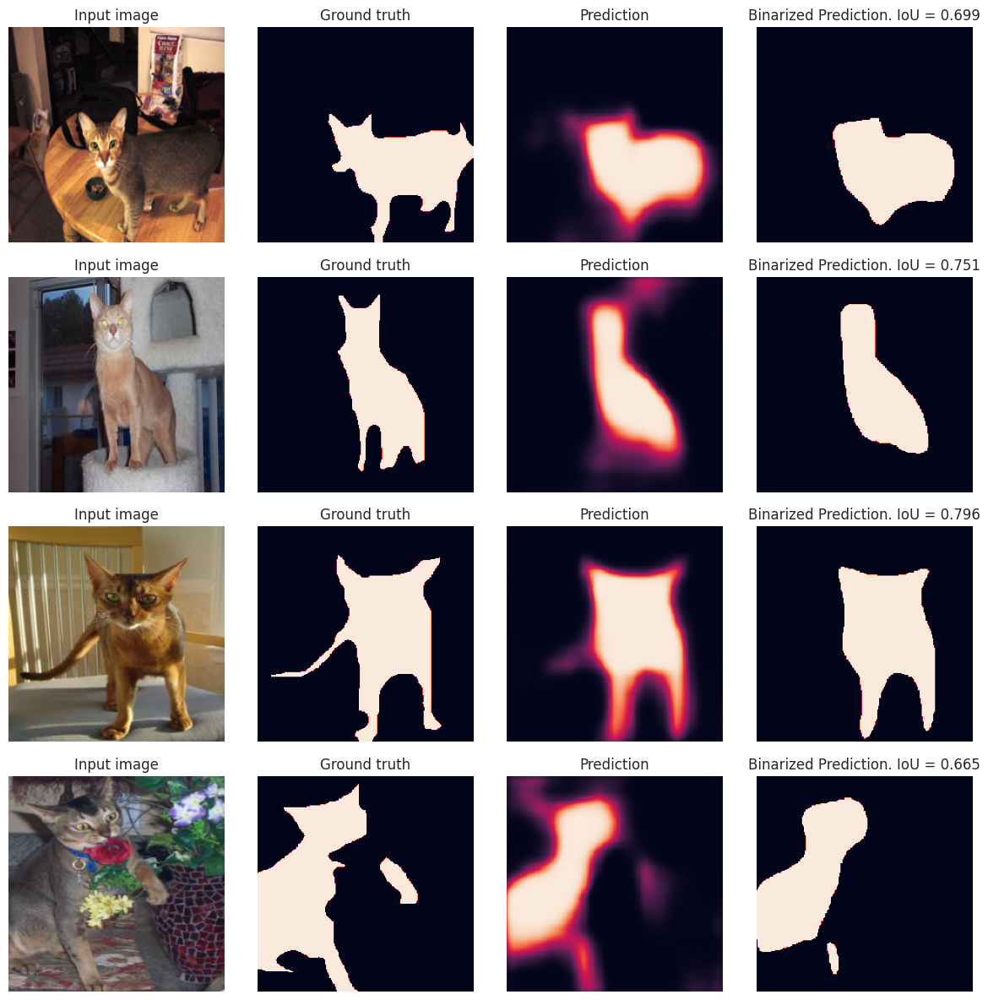

In [33]:
model.load_state_dict(torch.load('dump/model.pth')['model'])

model.eval()

inputs, labels = next(iter(test_dataloader))
inputs = inputs.to(device)[:4]
labels = labels.to(device)[:4]

pred = model(inputs)
pred = pred.sigmoid().data.squeeze().cpu().numpy()

input_images_rgb = [denormalize(x) for x in inputs.cpu()]

target_masks = [x for x in labels.cpu().numpy()]
pred_rgb = [x for x in pred]

fig, axs = plt.subplots(4, 4, figsize=(12, 12))
for ax, img, target, pred in zip(axs, input_images_rgb, target_masks, pred_rgb):
    ax[0].imshow(img)
    ax[0].axis('off')
    ax[0].set_title('Input image')
    
    ax[1].imshow(target)
    ax[1].axis('off')
    ax[1].set_title('Ground truth')
    
    ax[2].imshow(pred)
    ax[2].axis('off')
    ax[2].set_title(f'Prediction')
    
    ax[3].imshow((pred >= .5).astype(int))
    ax[3].axis('off')
    ax[3].set_title(f'Binarized Prediction. IoU = {JaccardIndex(task="binary")(torch.tensor(pred), torch.tensor(target)):.3f}')
fig.tight_layout()
plt.show()

### `Как использовать предобученную для сегментации сеть из torchvision.models`

Загрузим сеть [**deeplabv3+**](https://arxiv.org/pdf/1802.02611v3.pdf):

In [30]:
from torchvision.models.segmentation import fcn_resnet50

In [31]:
model = fcn_resnet50(pretrained=True)

In [32]:
import urllib

url, filename = ("https://github.com/pytorch/hub/raw/master/images/deeplab1.png", "deeplab1.png")
try: 
    urllib.URLopener().retrieve(url, filename)
except: 
    urllib.request.urlretrieve(url, filename)

In [33]:
# open image from internet
input_image = Image.open(filename).convert("RGB")
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean = CHANNEL_MEAN,
        std  = CHANNEL_STD
    ),
])

input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)

model.to(device)
model.eval()
with torch.no_grad():
    input_batch = input_batch.to(device)
    output = model(input_batch)['out'][0]
output_predictions = output.argmax(0)
output_predictions

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], device='cuda:0')

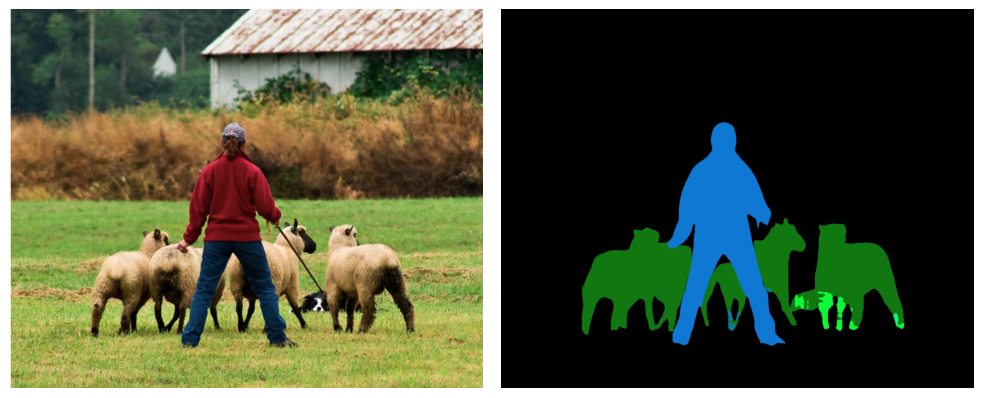

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# create a color pallette, selecting a color for each class
palette = np.array([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors  = np.arange(21)[:, None]* palette
colors  = (colors % 255).astype("uint8")

# plot the semantic segmentation predictions of 21 classes in each color
image_mask = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
image_mask.putpalette(colors)

for ax, image in zip(axes.reshape(-1), [input_image, image_mask]):
    ax.imshow(image)
    ax.axis('off')

fig.tight_layout()
plt.show()

### `Как использовать предобученную для детекции сеть из torchvision.models`

Посмотрим как можно использовать уже обученную модель для детекции. Мы возьмем архитектуру `faster R-CNN` и обученные веса для ResNet50 из [torchvision](https://pytorch.org/vision/master/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn_v2.html).

Более подробный гайд можно найти по [ссылке](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html)

In [35]:
from torchvision import utils

from torchvision.models import ResNet50_Weights
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights

In [36]:
input_image = Image.open(filename).convert("RGB")

preprocess = transforms.Compose([
    transforms.ToTensor(),
])

input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)

In [37]:
model = fasterrcnn_resnet50_fpn_v2(
    num_classes      = 91, 
    weights          = FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1, 
    weights_backbone = ResNet50_Weights.IMAGENET1K_V2
)

Переведем модель в `.eval()` режим для предсказания положений bounding boxes. В `.train()` модель будет сразу считать и возвращать `loss`, то есть в `forward` подается изображение и таргеты **вместе**.

In [38]:
model.to(device)
model.eval()

with torch.no_grad():
    input_batch = input_batch.to(device)
    output = model(input_batch)

Модель выдает список словарей, в которых содержатся: 
- позиции рамок,
- метки класса в каждой рамкм,
- степень уверенность каждой рамки.

In [39]:
output

[{'boxes': tensor([[ 449.9263,  308.7416,  775.8239,  916.7845],
          [ 216.3169,  593.8627,  429.3763,  890.4681],
          [ 851.2169,  582.7171, 1097.7677,  880.5852],
          [ 375.4074,  630.4415,  526.0110,  882.4100],
          [ 571.9980,  566.2551,  834.0962,  879.3435],
          [ 784.0010,  761.6616,  864.4852,  824.7313],
          [ 369.1308,  565.7283,  865.1863,  903.5755],
          [ 783.7712,  762.1111,  945.3759,  830.2230],
          [ 573.6378,  558.6641,  840.0313,  885.8506],
          [ 432.6731,  640.7375,  668.4288,  877.4196],
          [ 537.4653,  652.7357,  723.8277,  873.7333],
          [ 783.2552,  761.0068,  867.9456,  824.0157],
          [ 267.8242,  588.2518,  668.8555,  900.6806]], device='cuda:0'),
  'labels': tensor([ 1, 20, 20, 20, 20, 18, 20, 18, 21, 20, 20, 17, 20], device='cuda:0'),
  'scores': tensor([0.9997, 0.9990, 0.9989, 0.9975, 0.9867, 0.9285, 0.2778, 0.1957, 0.1064,
          0.1056, 0.0893, 0.0597, 0.0542], device='cuda:0')}]

In [44]:
@torch.no_grad()
def vis_box_batch(imgs, targets):
    
    res = []
    for img, target in zip(imgs, targets):
        
        box = utils.draw_bounding_boxes(
            img, 
            boxes  = target["boxes"][target['scores'] > 0.8],
            labels = [f"Label {l}" for l in target["labels"][target['scores'] > 0.8]],
            width     = 4,
        )
        
        res.append(box.cpu().detach())
        
    res = torch.stack(res)
    
    img_grid = utils.make_grid(res, nrow=int(np.sqrt(res.shape[0])))
    
    img_grid = transforms.functional.to_pil_image(img_grid)
    
    return img_grid

Визуализируем получение объекты.

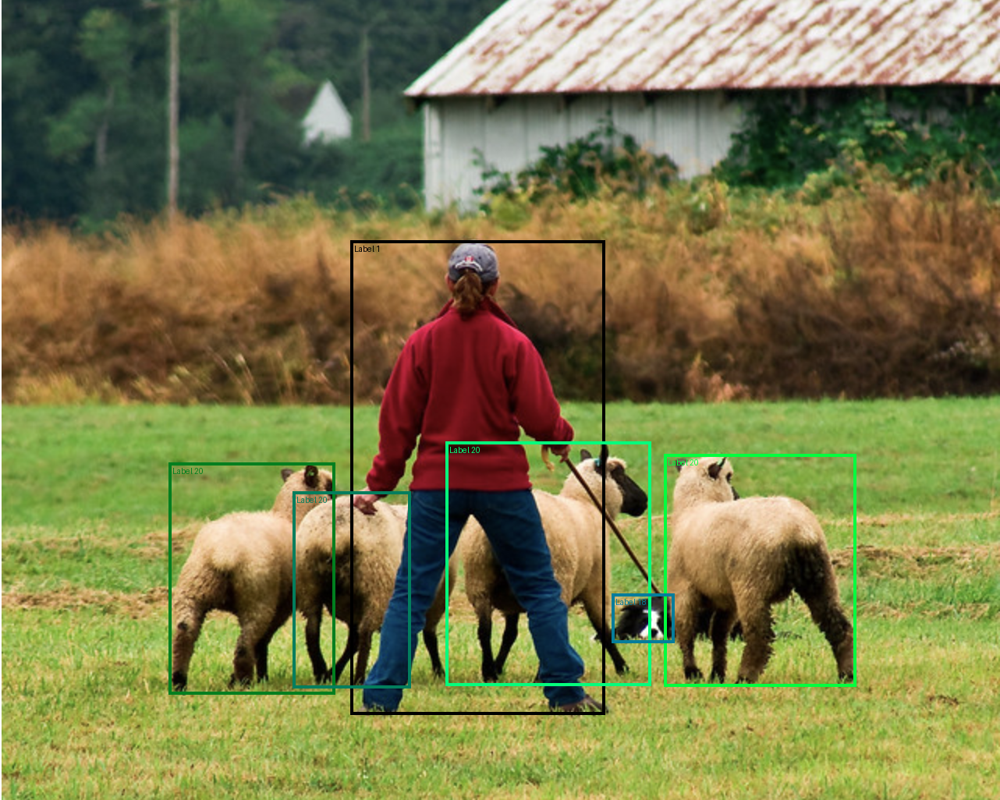

In [45]:
vis_box_batch(input_batch, output)

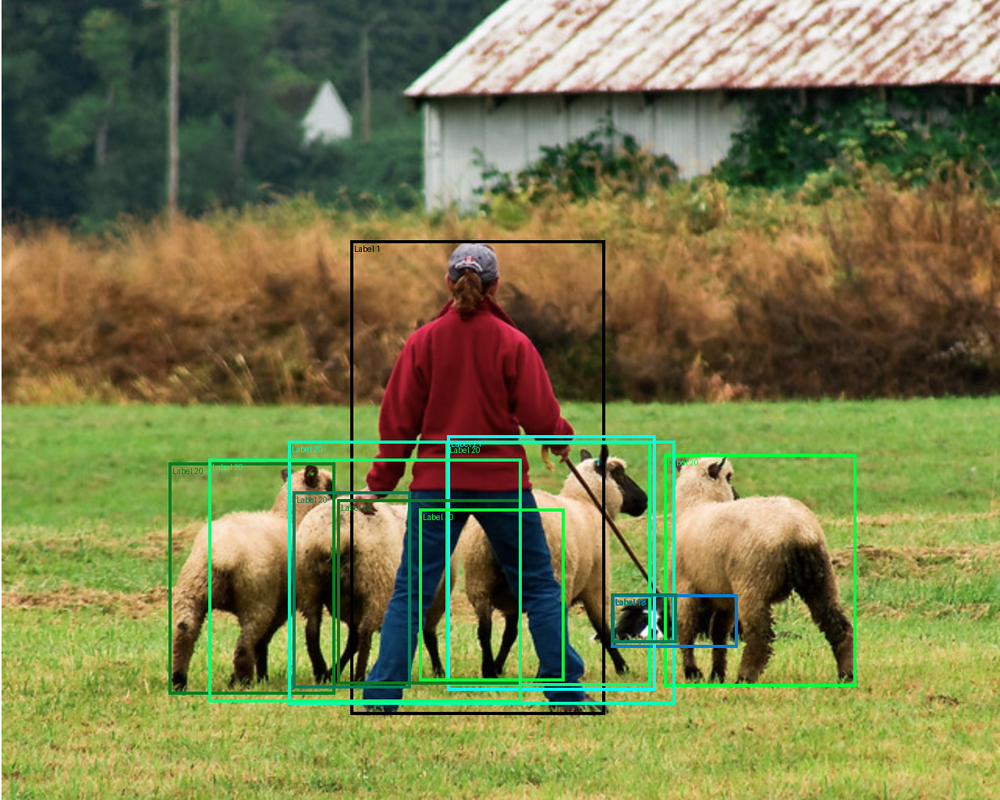

In [41]:
vis_box_batch(input_batch, output)

Мы видим, что bounding box слишком много, причем в некоторых из них мы не уверены, отфильтруем их.

In [46]:
filter_out = []
threshold  = 0.5
for out in output:
    d = {
        'boxes' : out['boxes'][out['scores']  > threshold],
        'labels': out['boxes'][out['scores']  > threshold],
        'scores': out['scores'][out['scores'] > threshold],
        'labels': out['labels'][out['scores'] > threshold],
    }
    filter_out.append(d)
    
filter_out

[{'boxes': tensor([[ 449.9263,  308.7416,  775.8239,  916.7845],
          [ 216.3169,  593.8627,  429.3763,  890.4681],
          [ 851.2169,  582.7171, 1097.7677,  880.5852],
          [ 375.4074,  630.4415,  526.0110,  882.4100],
          [ 571.9980,  566.2551,  834.0962,  879.3435],
          [ 784.0010,  761.6616,  864.4852,  824.7313]], device='cuda:0'),
  'labels': tensor([ 1, 20, 20, 20, 20, 18], device='cuda:0'),
  'scores': tensor([0.9997, 0.9990, 0.9989, 0.9975, 0.9867, 0.9285], device='cuda:0')}]

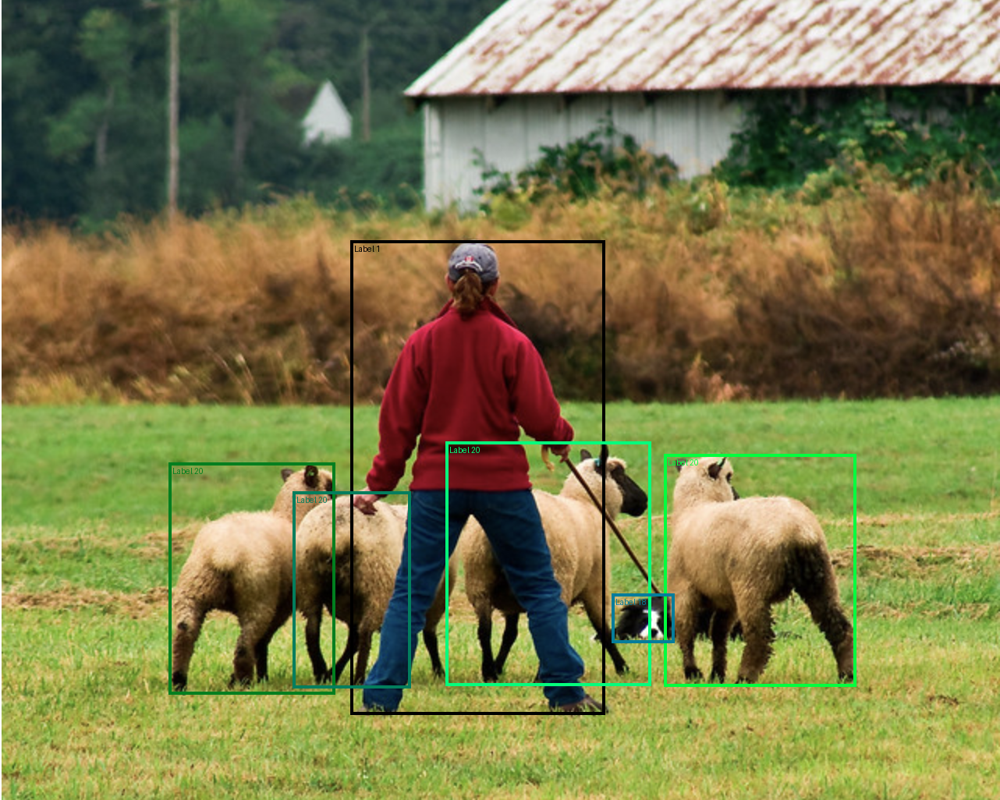

In [47]:
vis_box_batch(input_batch, filter_out)

### `Регуляризация свёрточных ядер`

[Wang et al., 2019](https://arxiv.org/abs/1911.12207), примерно 258 цитат

[Позновательная книга](https://www.researchgate.net/publication/343131267_On_the_regularization_of_convolutional_kernel_tensors_in_neural_networks)  

Мы уже обсуждали, что операция свёртки представима в виде матричного умножения однозначно определяемой по ядру $K$ матрицы $M$ на вытянутое в вектор входное изображение. Во избежание численных ошибок, а так же проблем с градиентами, хотим, чтобы $\|\mathrm{vec}(X)\| \approx \|\mathrm{vec}(Y)\|$, где $X$ и $Y$ — вход и выход свёрточного слоя соответственно, а $\mathrm{vec}(\cdot{})$ — операция "вытягивания" в вектор. Для достижения этого необходимо, чтобы матрица $M$ была близка к ортогональной. Для этого добавим регуляризационный член, ограничивающий по модулю сингулярные значения матрицы $M$ единицей.

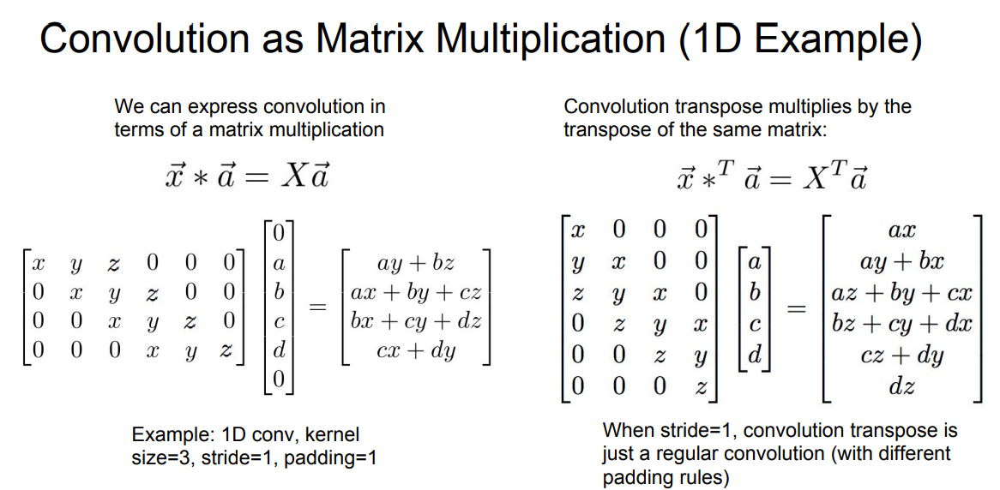

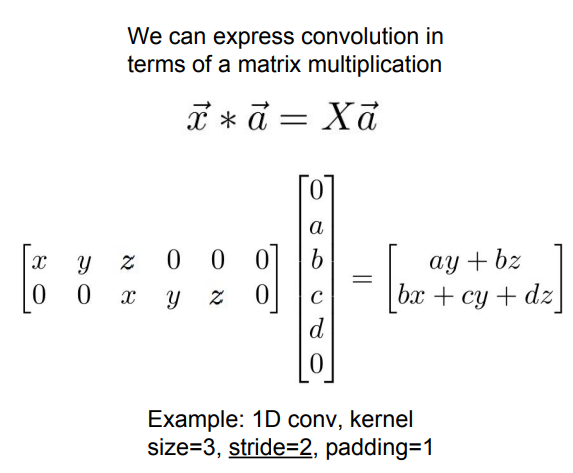

Возмьем авторскую имплементацию регуляризатора [КОД](https://github.com/samaonline/Orthogonal-Convolutional-Neural-Networks/blob/aa7f56901c661a124e0cfe72eb2c9dc98045ce94/imagenet/utils.py#L34), принимающей ядро свертки и возвращающей значение регуляризатора.

In [57]:
def deconv_orth_dist(kernel, stride = 2, padding = 1):
    [o_c, i_c, w, h] = kernel.shape
    output = torch.conv2d(kernel, kernel, stride=stride, padding=padding)
    target = torch.zeros((o_c, o_c, output.shape[-2], output.shape[-1])).to(device)
    ct = int(np.floor(output.shape[-1]/2))
    target[:,:,ct,ct] = torch.eye(o_c).to(device)
    return torch.norm(output - target)

В качетсве примера имплементации возьмем более легкую и <s>не так запарно обучаемую</s> модель `mobilenet_v3_small` для решения задачи классификации изображений CIFAR10. Для этого для каждого блока MobileNet V3 будем регуляризировать свертку.

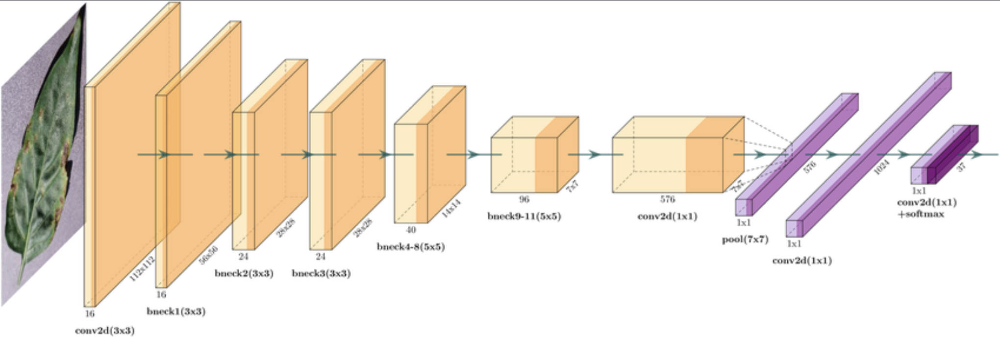

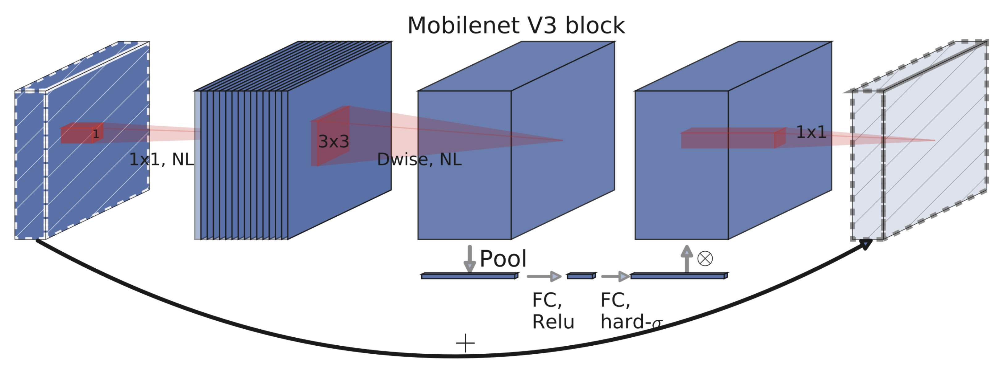

Определим трэйнлупу для новой архитектуры.

In [58]:
@torch.no_grad()
def eval_mobile(model, loss_fn, test_loader, batch_num):

    model.eval()
    if test_loader is None:
        return 0., 0.

    test_acc  = 0
    test_loss = 0.
    img_count = 0
    for x, y in test_loader:
        x, y = x.to(device), y.to(device)
        out = model(x)

        bs = x.shape[0]
        test_loss += loss_fn(out, y) * bs
        test_acc  += (out.argmax(-1) == y).sum().item()
        img_count += bs
    
    test_loss /= img_count
    test_acc  /= img_count
 
    wandb.log({
        'test/loss'    : test_loss,
        'test/accuracy': test_acc
    }, step=batch_num)

    return test_loss, test_acc


def train_mobile(model, num_epochs, optimizer, loss_fn, scheduler,
                train_loader, test_loader=None, log_dir='./dump', reg_rate=.1, verbose=False):
    """Training loop for mobilenet_v3_small
    
    Args:
        model (torch.nn.Module): training segmentation model
        num_epochs (int): amount of epochs
        optimizer (torch.optim.Optimizer): defined optimizer
        loss_fn (torch.nn.Module): loss cryterion
        scheduler (torch.optim.lr_scheduler): scheduler
        train_loader (torch.utils.data.dataloader.DataLoader): train dataloader
        test_loader (torch.utils.data.dataloader.DataLoader): test dataloader
        reg_rate (float): regularization coefficient
    """    
    try:
        batch_num = 0
        pbar = tqdm.tqdm(range(num_epochs), disable=not verbose)

        for _ in pbar:    
            model.train()

            for x, y in train_loader:
                optimizer.zero_grad()

                x, y = x.to(device), y.to(device)

                out  = model(x)
                loss = loss_fn(out, y)

                train_loss = loss.item()
                
                diff  = 0
                for i in range(1, 12):
                    for p in model.features[i].block:
                        for _, pp in p.named_children():
                            if isinstance(pp, torch.nn.Conv2d):
                                diff = diff + deconv_orth_dist(
                                    kernel  = pp.weight, 
                                    stride  = pp.stride[0],
                                    padding = pp.padding[0]
                                )
            
                diff = diff * reg_rate

                loss = loss + diff
                loss.backward()
                optimizer.step()

                accuracy = (out.argmax(-1) == y).sum() / y.shape[0]
                wandb.log({
                    'train/loss'                 : train_loss,
                    'train/metricsRegularization': diff.item(),
                    'train/total_loss'           : loss.item(),
                    'train/accuracy'             : accuracy.item()
                }, step=batch_num)
                

                batch_num += 1
            
            scheduler.step()

            test_loss, test_acc = eval_mobile(
                model       = model,
                loss_fn     = loss_fn,
                test_loader = test_loader,
                batch_num   = batch_num
            )
            
            torch.save({'model': model.state_dict()}, f'{log_dir}/model_smallv3.pth')

            wandb.log({'optim/lr': scheduler.get_last_lr()[0]}, batch_num)

            if verbose:
                pbar.set_description(
                        'lr: {:.2f} Train Loss: {:.2f}, Train accuracy: {:.2f}; Test Loss: {:.2f}, Test accuracy: {:.2f}'.format(
                            scheduler.get_last_lr()[0], loss.item(), accuracy.item(), test_loss, test_acc
                        )
                    )
    finally:
        wandb.finish()

Мы хотим исследовать, как именно регуляризация сверток предложенная выше влияет на переобучение модели. Проверять идею мы будем на датасете `CIFAR10`, так как на нем будет очень легко переобучить модель. Кроме того, мы не будем использовать аугментации, так как наша цель понять как предложенный нами метод влияет на переобучение.

In [59]:
from torchvision.models import mobilenet_v3_small
from torchvision.datasets import CIFAR10

In [60]:
mobilenet_v3_small(None).classifier

Sequential(
  (0): Linear(in_features=576, out_features=1024, bias=True)
  (1): Hardswish()
  (2): Dropout(p=0.2, inplace=True)
  (3): Linear(in_features=1024, out_features=1000, bias=True)
)

In [24]:
set_global_seed(42)

train_dataset = CIFAR10('.', transform=transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean = CHANNEL_MEAN,
        std  = CHANNEL_STD
    )
]), download=True)

train_dataset, test_dataset = torch.utils.data.random_split(train_dataset, (25000, 25000))

train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=True, drop_last=True)
test_dataloader  = DataLoader(test_dataset,  batch_size=128, shuffle=False)

Files already downloaded and verified


In [25]:
set_global_seed(42)

lr           = 1e-4
weight_decay = 1e-4

# load model from torchvision hub
model = mobilenet_v3_small(weights=None)
model.classifier[3] = nn.Linear(1024, 10)
model.to(device)

# define train env
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=.98)


# init new experiment of wandb
wandb.init(
    project = 'ImageSegmentationPrac',
    name    = 'mobilenet_v3_small_no_regul',
    resume  = "never",
)

# start train of model without regularization
train_mobile(
    model        = model, 
    num_epochs   = 15, 
    optimizer    = optimizer, 
    loss_fn      = criterion, 
    scheduler    = scheduler,
    train_loader = train_dataloader, 
    test_loader  = test_dataloader, 
    reg_rate     = 0.0, 
    verbose      = True
)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: 3145tttt to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


lr: 0.00 Train Loss: 1.25, Train accuracy: 0.56; Test Loss: 1.91, Test accuracy: 0.38: 100


optim/lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁▁
test/accuracy,▁▁▃▇███████████
test/loss,██▇▂▁▁▁▁▁▂▂▂▂▃▃
train/accuracy,▂▂▁▂▄▅▃▅▅▄▅▅▅▆▅▄▇▆▅▅▆▆▆▇▇▇▇▇▇▇▇█▆█▇██▆▇█
train/loss,█▇▆▅▆▅▅▄▄▅▄▄▄▄▃▃▃▄▃▃▃▃▂▃▃▂▃▂▁▃▂▂▂▂▂▁▃▂▂▂
train/metricsRegularization,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▇█▇▇▆▆▆▅▆▆▆▅▆▅▄▅▄▄▃▄▅▄▃▃▃▄▃▄▄▄▃▃▂▃▂▂▃▁▁
optim/lr,7e-05
test/accuracy,0.38488
test/loss,1.90728
train/accuracy,0.5625


In [26]:
set_global_seed(42)

lr           = 1e-4
weight_decay = 1e-4

model = mobilenet_v3_small(weights=None)
model.classifier[3] = nn.Linear(1024, 10)
model.to(device)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=.98)

reg_rate  = 0.3
wandb.init(
    project = 'ImageSegmentationPrac',
    name    = f'mobilenet_v3_small_with_regul_{reg_rate}',
    resume  = 'never',
)

train_mobile(
    model        = model, 
    num_epochs   = 15, 
    optimizer    = optimizer, 
    loss_fn      = criterion, 
    scheduler    = scheduler,
    train_loader = train_dataloader, 
    test_loader  = test_dataloader, 
    reg_rate     = reg_rate, 
    verbose      = True
)

lr: 0.00 Train Loss: 133.22, Train accuracy: 0.48; Test Loss: 1.70, Test accuracy: 0.40: 1


optim/lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁▁
test/accuracy,▁▁▁▆▇▇█████████
test/loss,██▇▄▂▂▁▁▁▁▁▁▁▁▂
train/accuracy,▂▁▂▄▃▃▃▂▄▅▃▄▄▄▅▆▆▆▄▄▅▆▆▅▅▇▆█▆▆▇▆▅▆▇▇▆▅█▆
train/loss,█▇▇▇█▆▇▆▅▅▆▆▆▅▅▆▅▅▅▅▆▅▅▄▃▃▃▅▄▄▃▃▂▃▃▃▃▂▂▁
train/metricsRegularization,█▇▇▇▇▆▆▆▆▆▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,███▇▆▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
optim/lr,7e-05
test/accuracy,0.4022
test/loss,1.69894
train/accuracy,0.48438


In [27]:
set_global_seed(42)

lr           = 1e-4
weight_decay = 1e-4

model = mobilenet_v3_small(weights=None)
model.classifier[3] = nn.Linear(1024, 10)
model.to(device)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=.98)

reg_rate  = 1.
wandb.init(
    project = 'ImageSegmentationPrac',
    name    = f'mobilenet_v3_small_with_regul_{reg_rate}',
    resume  = 'never',
)

train_mobile(
    model        = model, 
    num_epochs   = 15, 
    optimizer    = optimizer, 
    loss_fn      = criterion, 
    scheduler    = scheduler,
    train_loader = train_dataloader, 
    test_loader  = test_dataloader, 
    reg_rate     = reg_rate, 
    verbose      = True
)

lr: 0.00 Train Loss: 437.86, Train accuracy: 0.48; Test Loss: 1.67, Test accuracy: 0.40: 1


optim/lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁▁
test/accuracy,▁▁▁▆▇▇▇▇███████
test/loss,███▄▂▂▂▁▁▁▁▁▁▁▁
train/accuracy,▁▂▄▃▄▅▅▅▅▄▃▅▄▄▆▅▄▅█▆▆▅▇▇▇▇▆▇▇██▆▇▇▇▆▇█▆▆
train/loss,█▆▆▆▅▄▅▄▃▅▄▄▄▃▄▃▂▄▃▄▂▂▃▃▃▁▂▂▂▃▂▁▂▂▂▁▂▂▁▂
train/metricsRegularization,██▇▆▆▆▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/total_loss,█▆▆▆▆▅▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
optim/lr,7e-05
test/accuracy,0.40012
test/loss,1.66948
train/accuracy,0.48438


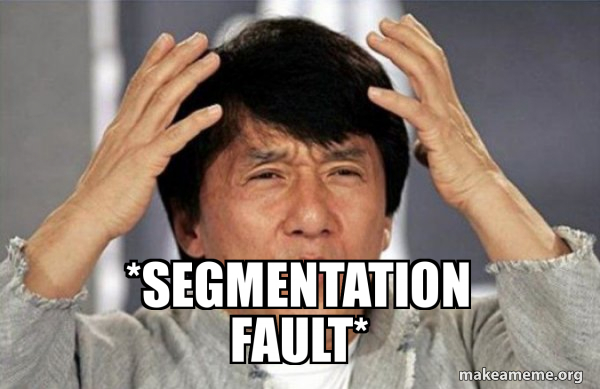